In [1]:
import json
import networkx as nx
from more_itertools import collapse
from networkx.readwrite import json_graph

# Cleaning

In [2]:
json_data = open('../data/acteurs_simple2.json').read()
deputes_raw = json.loads(json_data)

deputes = deputes_raw['export']['acteurs']['acteur']

In [3]:
organes = deputes_raw['export']['organes']['organe']

In [4]:
partis = {}
for organe in organes:
    partis[organe['uid']] = organe['libelle']

In [5]:
noms_deputes = {}

for dep in deputes:
    ident = dep['etatCivil']['ident']
    nom = '{} {} {}'.format(ident['civ'], ident['prenom'], ident['nom'])
    noms_deputes[dep['uid']['#text']] = nom

In [6]:
json_data = open('../data/Scrutins_XIV.json').read()
scrutins_raw = json.loads(json_data)
scrutins = scrutins_raw['scrutins']['scrutin']

# Visualization

In [7]:
vertices = []
edges = {}
votant_ajoute = {}
lien_ajoute = {}

for i, scrutin in enumerate(scrutins):
    if scrutin['dateScrutin'].startswith('2016'):
        acteurs_contre = []
        acteurs_pour = []
        for groupe in scrutin['ventilationVotes']['organe']['groupes']['groupe']:
            contres = groupe['vote']['decompteNominatif']['contre']
            if contres is not None:
                if isinstance(contres['votant'], list):
                    for votant in contres['votant']:
                        id = votant['acteurRef']
                        if id not in acteurs_contre:
                            acteurs_contre.append(id)
                            if id not in votant_ajoute:
                                vertices.append((id, {'group': groupe['organeRef']}))
                                votant_ajoute[id] = id
                else:
                    id = contres['votant']['acteurRef']
                    if id not in acteurs_contre:
                        acteurs_contre.append(id)
                        if id not in votant_ajoute:
                            vertices.append((id, {'group': groupe['organeRef']}))
                            votant_ajoute[id] = id
            pours = groupe['vote']['decompteNominatif']['pour']
            if pours is not None:
                if isinstance(pours['votant'], list):
                    for votant in pours['votant']:
                        id = votant['acteurRef']
                        if id not in acteurs_pour:
                            acteurs_pour.append(id)
                            if id not in votant_ajoute:
                                vertices.append((id, {'group': groupe['organeRef']}))
                                votant_ajoute[id] = id
                else:
                    id = pours['votant']['acteurRef']
                    if id not in acteurs_pour:
                        acteurs_pour.append(id)
                        if id not in votant_ajoute:
                            vertices.append((id, {'group': groupe['organeRef']}))
                            votant_ajoute[id] = id
        
        for i in range(len(acteurs_pour)):
            for j in range(i + 1, len(acteurs_pour)):
                if acteurs_pour[i] + acteurs_pour[j] in lien_ajoute:
                    edges[acteurs_pour[i] + acteurs_pour[j]]['weight'] += 1
                elif acteurs_pour[j] + acteurs_pour[i] in lien_ajoute:
                    edges[acteurs_pour[j] + acteurs_pour[i]]['weight'] += 1
                else:
                    couple = acteurs_pour[i] + acteurs_pour[j]
                    lien_ajoute[couple] = couple
                    edges[couple] = {'source': acteurs_pour[i], 'target': acteurs_pour[j], 'weight': 1}
        
        for i in range(len(acteurs_contre)):
            for j in range(i + 1, len(acteurs_contre)):
                if acteurs_contre[i] + acteurs_contre[j] in lien_ajoute:
                    edges[acteurs_contre[i] + acteurs_contre[j]]['weight'] += 1
                elif acteurs_contre[j] + acteurs_contre[i] in lien_ajoute:
                    edges[acteurs_contre[j] + acteurs_contre[i]]['weight'] += 1
                else:
                    couple = acteurs_contre[i] + acteurs_contre[j]
                    lien_ajoute[couple] = couple
                    edges[couple] = {'source': acteurs_contre[i], 'target': acteurs_contre[j], 'weight': 1}

In [8]:
nb_lien_min = 15
edges = {k: v for (k, v) in edges.items() if v['weight'] >= nb_lien_min}
vertices = [v for v in vertices if v[0] in collapse([(edge['source'], edge['target']) for edge in edges.values()])]

In [9]:
G = nx.Graph()
for node in vertices:
    G.add_node(noms_deputes[node[0]], group=partis[node[1]['group']])
G.add_edges_from([(noms_deputes[edge['source']], noms_deputes[edge['target']],
                   {'weight': edge['weight']}) for edge in edges.values()])

In [10]:
from networkx.readwrite import json_graph
data = json_graph.node_link_data(G)
with open('../docs/node_link_data.json', 'w') as f:
    f.write(json.dumps(data))
    f.close()

# HoloViews (using Bokeh)


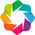

In [11]:
import holoviews as hv

hv.extension('bokeh')

%opts Nodes Graph [width=800 height=800 xaxis=None yaxis=None]

In [12]:
graph_nx = hv.Graph.from_networkx(G, nx.spring_layout, center=[1/2, 1/2])

In [13]:
%%opts Graph [color_index='Parti' edge_color_index='Weight'] (cmap='Category10' edge_cmap='Blues8')
x, y = graph_nx.nodes.array([0, 1]).T
node_indices = [noms_deputes[node[0]] for node in vertices]
node_labels = [partis[node[1]['group']] for node in vertices]

source = [noms_deputes[edge['source']] for edge in edges.values()]
target = [noms_deputes[edge['target']] for edge in edges.values()]
edge_labels = [edge['weight'] for edge in edges.values()]
path = graph_nx.edgepaths

nodes = hv.Nodes((x, y, node_indices, node_labels), kdims=['x', 'y', 'Nom'], vdims='Parti')
graph = hv.Graph(((source, target, edge_labels), nodes, path), vdims='Weight')

In [14]:
graph

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Graph   [start,end]   (Weight)

In [15]:
renderer = hv.renderer('bokeh')
renderer.save(graph, '../docs/bokeh')

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/bokeh/core/json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):
